In [ ]:
DecisionTree('Meal_Type')
# Pink = 'Side'; Orange = 'Breakfast'; Green = 'Lunch'; Cyan = 'Dinner'; Dark Blue = 'Snack'

Average Leaf Gini = 0.056730871368180835
43.333333333333336% Accuracy


In [ ]:
# Combine normed values with bool categories w/o making 50,000 x 50,000 df for some reason
# Combines one part w/ rest NA, Combines other part with 1st NA, then combine non-NA
# Repeat w/ Meal_Type
normed1 = pd.concat([normed, dfCatBin.select_dtypes(bool)])
normed2 = pd.concat([dfCatBin.select_dtypes(bool), normed])
normed3 = normed1.combine_first(normed2)
normed4 = pd.concat([normed3, df['Meal_Type']])
normed5 = pd.concat([df['Meal_Type'], normed3])
normedCatBin = normed4.combine_first(normed5)
u = ['Breakfast', 'Lunch', 'Dinner', 'Snack', 'Side']
for i in normedCatBin.itertuples():
  for j in u:
    if i.Meal_Type == j:
      normedCatBin.at[i.Index, 'Meal_Type'] = u.index(j)

# It does it too many times so truncate it to original size
normedCatBin = normedCatBin[0:597]
normedCatBin

,Appetizer,Beverage,Calories (kcal/kcal),Carbohydrates (g/kcal),Cholesterol (mg/kcal),Condiment,Dairy,Dairy-Alt,Dessert,Fat (g/kcal),...,Rice,Seafood,Snack,Sodium (mg/kcal),Soup,Sugars (g/kcal),Supplement,Vegetable,Vegetarian,Water_Intake (ml/kcal)
0,False,False,1.0,0.171429,0.000000,False,False,False,False,0.034286,...,False,False,False,0.114286,False,0.085714,False,False,False,0.714286
1,False,False,1.0,0.005263,0.052632,True,False,False,False,0.110526,...,False,False,False,0.736842,False,0.001053,False,False,False,0.000000
2,False,False,1.0,0.200000,0.000000,True,False,False,False,0.000000,...,False,False,False,10.000000,False,0.100000,False,False,False,0.000000
3,False,False,1.0,0.122222,0.111111,False,False,False,True,0.055556,...,False,False,False,0.333333,False,0.083333,False,False,False,0.000000
4,False,True,1.0,0.033333,0.000000,False,True,True,False,0.083333,...,False,False,False,5.333333,False,0.000000,False,False,False,8.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,False,False,1.0,0.050000,0.062500,True,False,False,False,0.075000,...,False,False,False,3.750000,False,0.025000,False,False,False,0.000000
593,False,False,1.0,0.175000,0.000000,False,False,False,False,0.012500,...,False,False,False,1.750000,False,0.025000,False,False,False,0.000000
594,False,False,1.0,0.210843,0.000000,False,False,False,False,0.003614,...,False,False,False,0.030120,False,0.007229,False,False,False,0.000000
595,False,False,1.0,0.217391,0.000000,False,False,False,False,0.004348,...,False,False,False,1.304348,False,0.004348,False,False,False,0.000000


In [ ]:
normedCatBin['Cholesterol (mg/kcal)']

,Cholesterol (mg/kcal)
0,0.000000
1,0.052632
2,0.000000
3,0.111111
4,0.000000
...,...
592,0.062500
593,0.000000
594,0.000000
595,0.000000


In [ ]:
### KMeans
# The only clusters that fully work are of type bool
# Maybe also normalize by Cal
# To try to see any patterns between each variable and every other
def kmean(clusters, normalized: bool = False):
  # n_clusters omitted in favor of cluster by category
  kmeans = KMeans(random_state = 42, max_iter = 5000)

  if normalized:
    correctBin = normedCatBin
  else:
    correctBin = dfCatBin

  # Special Case for Meal_Type
  if clusters == 'Meal_Type':
    u = ['Breakfast', 'Lunch', 'Dinner', 'Snack', 'Side']
    for i in correctBin.itertuples():
      for j in u:
        if i.Meal_Type == j:
          correctBin.at[i.Index, 'Meal_Type'] = u.index(j)

  kmeans.fit(correctBin[[clusters]])
  correctBin['Cluster'] = kmeans.labels_

  # Select only numeric columns
  numeric_columns = list(correctBin.select_dtypes(np.number).columns)
  if correctBin[clusters].dtype == bool:
    cluster = [True, False]

  if correctBin[clusters].dtype in ['float64', 'int64']:
    cluster = list([str(((i * 3) // float(correctBin['Cluster'].max())))
    for i in range(int(correctBin['Cluster'].max())) if True])

  # Plot 2 different graphs  on each side of diagonal
  g = sns.PairGrid(correctBin[numeric_columns], hue = 'Cluster', palette = 'Set2')
  g.map_upper(sns.scatterplot)
  g.map_lower(sns.kdeplot)
  g.map_diag(sns.kdeplot, lw = 3)
  g.add_legend()

  plt.suptitle(f'K-Means Clustering of Dietary Info Grouped by {clusters}', y = 1)
  plt.show()

  # Maybe change colors to depend on cluster increasingly w/ equidistant hex
  # cluster category's line graph will be blank


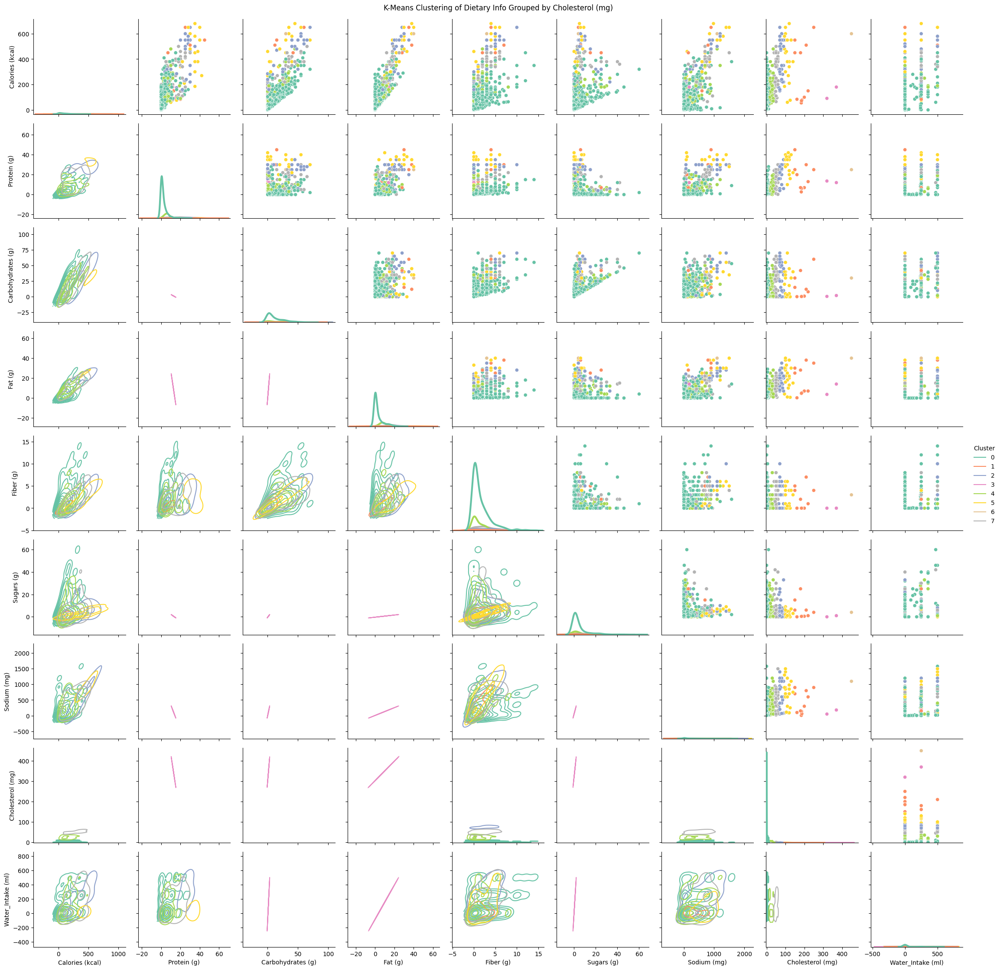

In [ ]:
# ~50% Clusters broken; rest OK
kmean('Cholesterol (mg)')

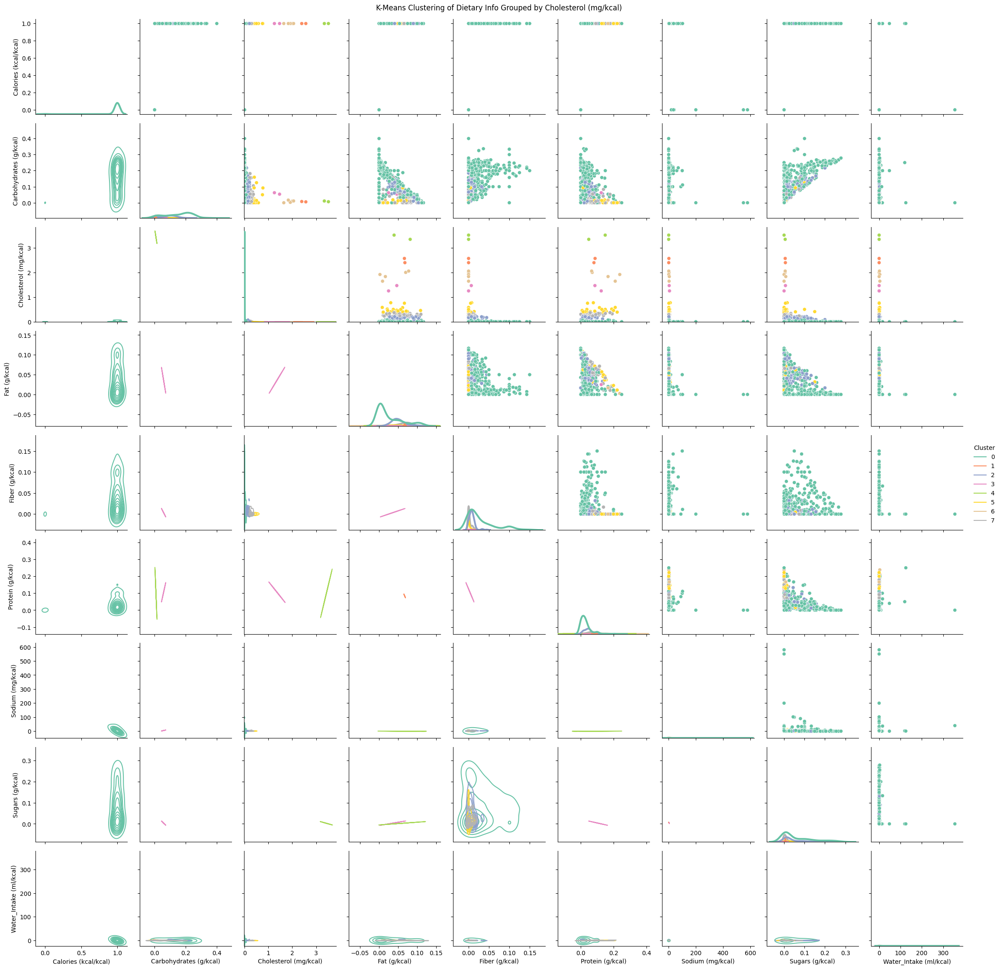

In [ ]:
kmean('Cholesterol (mg/kcal)', normalized = True)

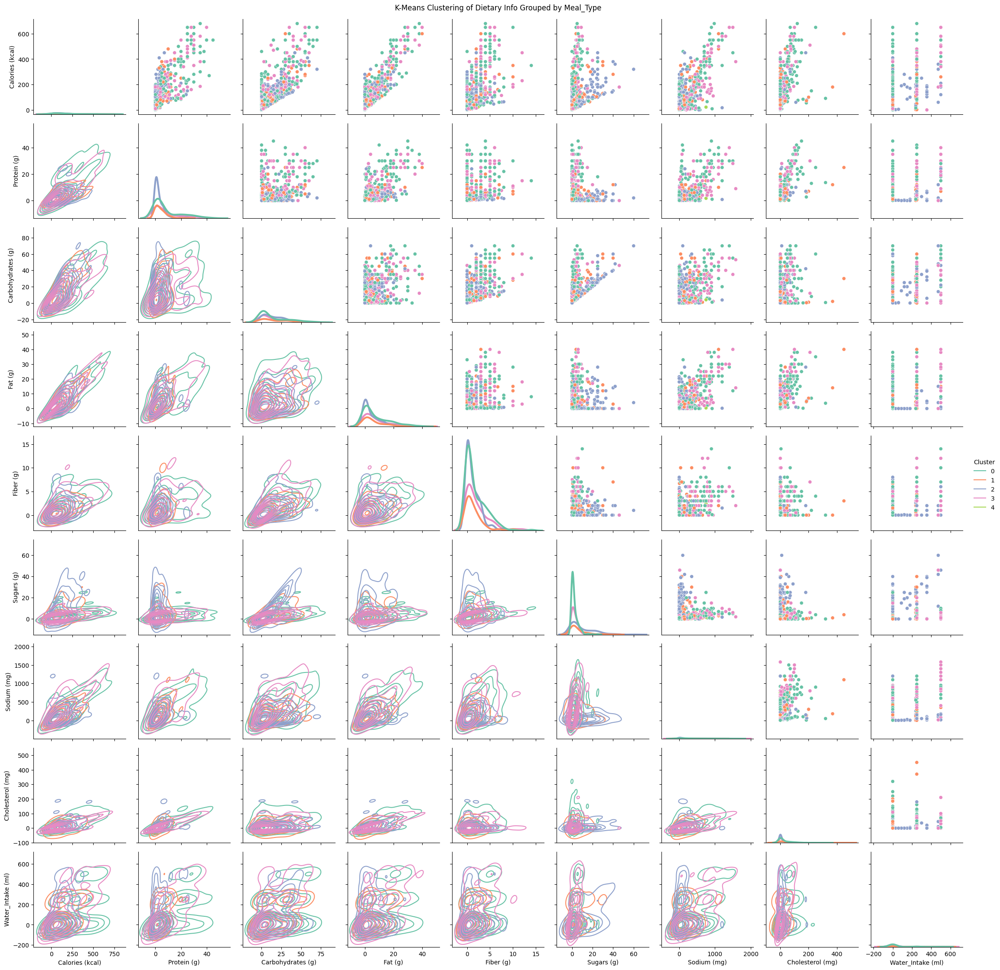

In [ ]:
kmean('Meal_Type')

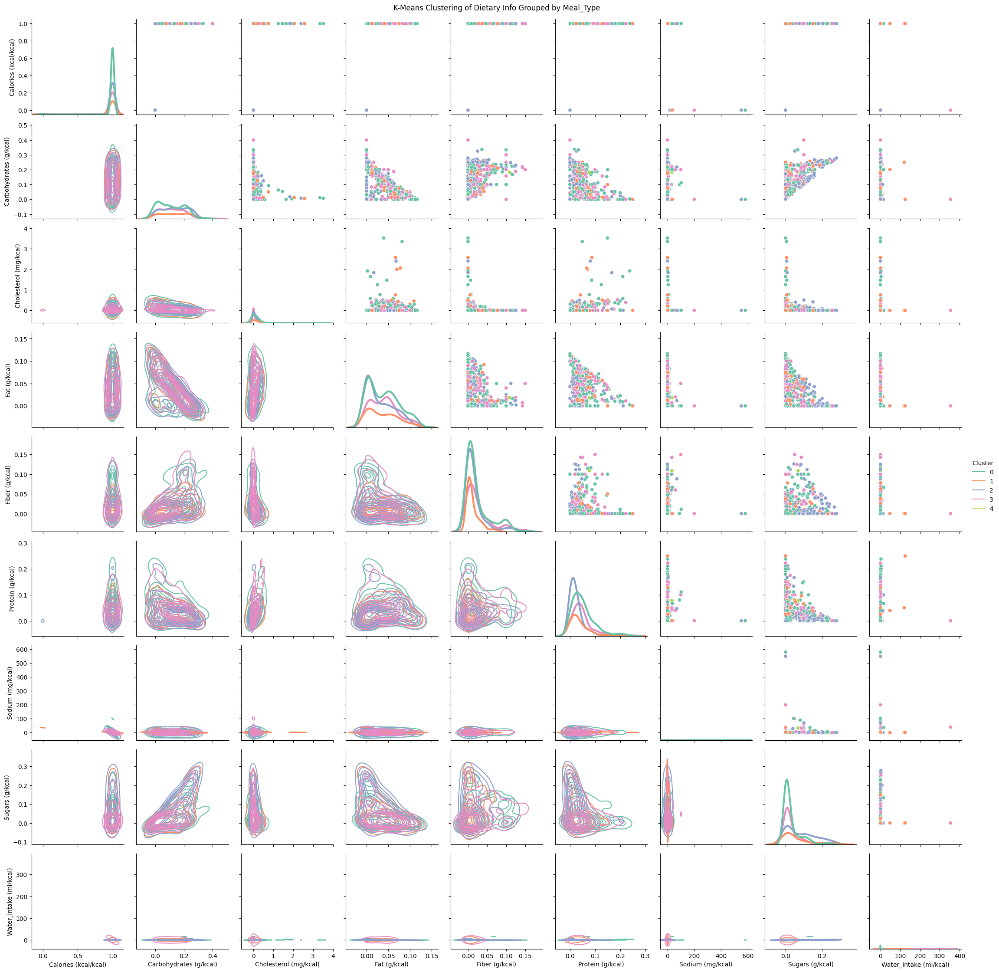

In [ ]:
kmean('Meal_Type', normalized = True)

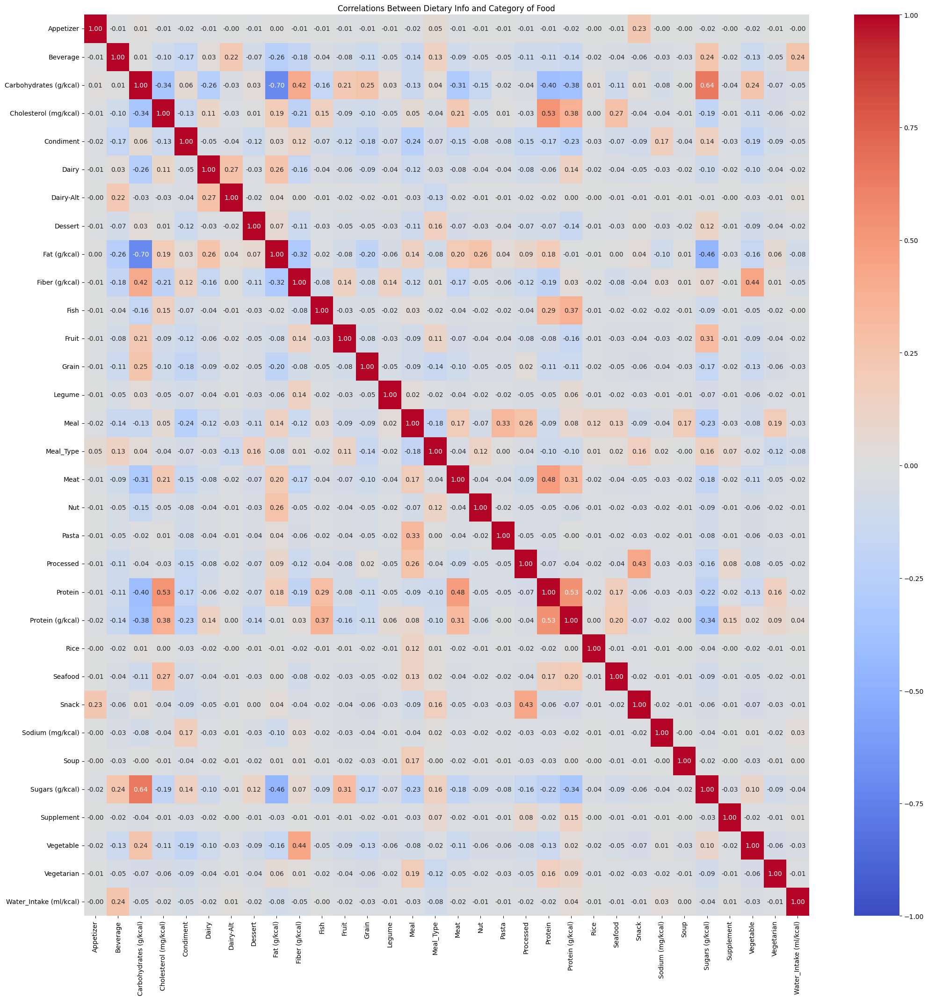

In [ ]:
# Heatmap w/ Binary Categories
corr = normedCatBin.corr()

plt.figure(figsize = (25, 25))
# Hide 'Calories (kcal/kcal)' and 'Cluster' row + column
sns.heatmap(corr.drop(['Cluster', 'Calories (kcal/kcal)'], axis = 0).drop(['Cluster', 'Calories (kcal/kcal)'], axis = 1),
            annot = True, cmap = 'coolwarm', fmt = '.2f', vmin = -1, vmax = 1)
plt.title('Correlations Between Dietary Info and Category of Food')
plt.show()

### Prediction of whether any given food is part of some category [Seafood, Meal, etc] is generally very accurate, based on Decision Tree
### Prediction of Calories from other dietary info is generally pretty accurate
### Ideally, this would be repeated with Calories normalized, as was done with the heatmaps, but time constraints mean next time
### Snacks generally have more outliers than usual in many metrics, based on KMeans
### Many Meal_Type blobs are flat and somewhat linear, based on KMeans
### The yellow cluster {~1 - 1.5 g Cholesterol} has blobs that generally have less variance than usual, based on KMeans
### Seafood have unique Calories, Sodium, and Cholesterol, based on Tree

###

###